In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import colorsys
import itertools as it
import pandas as pd
from datetime import datetime as dt
from datetime import timedelta
from pathlib import Path
from hypo_sleep import NumpyDecoder, Session
import spikeinterface.full as si
import spikeinterface.preprocessing as spp
from scipy import signal, stats
import xarray as xr
import statsmodels.api as sm
import statsmodels.formula.api as smf
from functools import partial
from ghostipy.dsp import signal_envelope
from spectral_connectivity import Multitaper, Connectivity, multitaper_connectivity
from spectral_connectivity.transforms import prepare_time_series
import re
from nitime.utils import dpss_windows
import json
import jax
import jax.numpy as jnp

import pdb

In [2]:
from hypo_sleep.analysis.utils import mt_specpb_xr_chunked_jax

In [2]:
data_path = Path("/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/")
# h1_dates = ["2024-05-21_10-28-00", "2024-05-23_06-00-36"]
# h2_dates = [
#     "2024-07-22_10-47-00",
#     "2024-07-23_05-47-21",
#     "2024-07-23_12-06-25",
#     "2024-07-25_05-55-34",
#     "2024-07-25_12-18-59",
# ]
# h3_dates = [
#     "2025-02-18_09-19-26",
#     "2025-02-20_08-58-57",
#     "2025-03-20_09-01-41",
# ]
# h4_dates = [
#     "2025-02-24_09-00-29",
# ]
full_dict = {
    "none": {
        "dates": [
            # "2024-05-20_11-22-17",
            "2024-05-21_10-28-00",
            "2024-05-23_06-00-36",
            "2024-07-22_10-47-00",
            "2024-07-23_05-47-21",
            "2024-07-23_12-06-25",
            "2024-07-25_05-55-34",
            "2024-07-25_12-18-59",
            "2025-02-18_09-19-26",
            "2025-02-20_08-58-57",
            "2025-03-20_09-01-41",
            "2025-02-24_09-00-29",
            # "2025-02-26_09-05-08",
        ],
        "configs": [
            # "9a68",
            "55a4",
            "929a",
            "3ad9",
            "20a7",
            "f9f7",
            "1f25",
            "70eb",
            "5d77",
            "790d",
            "8a55",
            "3e4b",
            # "d205",
        ],
        "animal": [
            # "HYDO01",
            "HYDO01",
            "HYDO01",
            "HYDO02",
            "HYDO02",
            "HYDO02",
            "HYDO02",
            "HYDO02",
            "HYDO03",
            "HYDO03",
            "HYDO03",
            "HYDO04",
        ],  # "HYDO04"],
    },
    "sleep": {
        "dates": [
            "2025-02-19_08-59-23",
            "2025-03-03_08-55-10",
            "2025-02-25_09-06-23",
            "2025-03-07_08-52-44",
        ],
        "configs": [
            "d628",
            "c687",
            "073a",
            "9080",
        ],
        "animal": ["HYDO03", "HYDO03", "HYDO04", "HYDO04"],
    },
    "food": {
        "dates": [
            "2025-02-21_09-04-29",
            "2025-02-28_09-02-06",
            "2025-03-04_08-55-25",
        ],
        "configs": [
            "a964",
            "0674",
            "bc96",
        ],
        "animal": ["HYDO03", "HYDO03", "HYDO04"],
    },
}
depth_ordered_chs = {
    "HYDO01": np.array(
        [
            "14",
            "31",
            "1",
            "16",
            "13",
            "15",
            "2",
            "30",
            "0",
            "17",
            "12",
            "9",
            "3",
            "29",
            "6",
            "18",
            "11",
            "8",
            "4",
            "28",
            "7",
            "19",
            "25",
            "5",
            "26",
            "22",
            "21",
            "24",
            "20",
            "23",
        ]
    ),
    "HYDO02": np.array(
        [
            "14",
            "31",
            "1",
            "16",
            "13",
            "15",
            "2",
            "30",
            "0",
            "17",
            "12",
            "9",
            "3",
            "29",
            "6",
            "18",
            "11",
            "8",
            "4",
            "28",
            "7",
            "19",
            "25",
            "5",
            "26",
            "22",
            "21",
            "24",
            "20",
            "23",
        ]
    ),
    "HYDO03": np.array(
        [
            "24",
            "23",
            "25",
            "22",
            "8",
            "7",
            "9",
            "6",
            "15",
            "0",
            "14",
            "1",
            "26",
            "21",
            "27",
            "20",
            "10",
            "5",
            "28",
            "19",
            "11",
            "4",
            "29",
            "18",
            "12",
            "3",
            "30",
            "17",
            "13",
            "2",
            "31",
            "16",
        ]
    ),
    "HYDO04": np.array(
        [
            "24",
            "23",
            "25",
            "22",
            "8",
            "7",
            "9",
            "6",
            "15",
            "0",
            "14",
            "1",
            "26",
            "21",
            "27",
            "20",
            "10",
            "5",
            "28",
            "19",
            "11",
            "4",
            "29",
            "18",
            "12",
            "3",
            "30",
            "17",
            "13",
            "2",
            "31",
            "16",
        ]
    ),
}
triggers = ["spi-peak", "so-peak", "nrem-null"]

In [4]:
# data_path = Path("/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/")
# full_dict = {
#     "none": {
#         "dates": [
#             "2025-02-18_09-19-26",
#             "2025-02-20_08-58-57",
#             "2025-03-20_09-01-41",
#             "2025-02-24_09-00-29",
#             # "2025-02-26_09-05-08",
#         ],
#         "configs": [
#             "5d77",
#             "790d",
#             "8a55",
#             "3e4b",
#             # "d205",
#         ],
#         "animal": [
#             "HYDO03",
#             "HYDO03",
#             "HYDO03",
#             "HYDO04",
#         ],  # "HYDO04"],
#     },
#     "sleep": {
#         "dates": [
#             "2025-02-19_08-59-23",
#             "2025-03-03_08-55-10",
#             "2025-02-25_09-06-23",
#             "2025-03-07_08-52-44",
#         ],
#         "configs": [
#             "d628",
#             "c687",
#             "073a",
#             "9080",
#         ],
#         "animal": ["HYDO03", "HYDO03", "HYDO04", "HYDO04"],
#     },
#     "food": {
#         "dates": [
#             "2025-02-21_09-04-29",
#             "2025-02-28_09-02-06",
#             "2025-03-04_08-55-25",
#         ],
#         "configs": [
#             "a964",
#             "0674",
#             "bc96",
#         ],
#         "animal": ["HYDO03", "HYDO03", "HYDO04"],
#     },
# }
# depth_ordered_chs = np.array(
#     [
#         "24",
#         "23",
#         "25",
#         "22",
#         "8",
#         "7",
#         "9",
#         "6",
#         "15",
#         "0",
#         "14",
#         "1",
#         "26",
#         "21",
#         "27",
#         "20",
#         "10",
#         "5",
#         "28",
#         "19",
#         "11",
#         "4",
#         "29",
#         "18",
#         "12",
#         "3",
#         "30",
#         "17",
#         "13",
#         "2",
#         "31",
#         "16",
#     ]
# )

##### Load resampled or raw MUA data

In [51]:
SAVE = True
SMOOTH = False
triggers = ["nrem-null", "so-peak", "spi-peak"]
trig_data_dict = {
    cond: {date: {trig: None for trig in triggers} for date in meta_dict["dates"]}
    for cond, meta_dict in full_dict.items()
}
print("loading mua")
# for cond, meta_dict in full_dict.items():
cond = "none"
meta_dict = full_dict[cond]
resamp_rate = "25ms"
mua_config = "398b"
for animal, date, config_id in zip(
    meta_dict["animal"], meta_dict["dates"], meta_dict["configs"]
):
    tmp_output_path = Path(
        "/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/",
        animal,
        date,
        config_id,
        "mua",
    )
    for trig in trig_data_dict[cond][date].keys():

        resamp_path = Path(
            "/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/resamp_mua/",
            f"{resamp_rate}_resamp_mua_{date}_{trig}_{mua_config}_mua-smooth.nc",
        )
        if resamp_path.exists():
            tmp_data = xr.load_dataarray(resamp_path, engine="h5netcdf")
            if resamp_rate != "4ms":
                # upsample to LFP Fs
                interp_time = pd.timedelta_range(
                    tmp_data.isel(time=0).time.values,
                    tmp_data.isel(time=-1).time.values,
                    freq="4ms",
                )
                tmp_data = tmp_data.interp(time=interp_time)
            trig_data_dict[cond][date][trig] = tmp_data
            continue
        load_path = Path(
            tmp_output_path,
            # f"5ms_resamp_mua_{trig}_39_mua_4-5thresh_2s_6892_{config_id}.nc",
            f"raw_mua_{trig}_39_mua_3SD_4s_398b_{config_id}.nc",
            # f"raw_mua_{trig}_39_mua_4-5thresh_2s_6892_{config_id}.nc",
        )
        if load_path.exists():
            tmp_data = xr.load_dataarray(load_path, engine="h5netcdf")
            tmp_mua = tmp_data.sortby("time")
            tmp_mua = tmp_mua.resample(time=resamp_rate).sum()
            if resamp_rate != "4ms":
                # upsample to LFP Fs
                interp_time = pd.timedelta_range(
                    tmp_mua.isel(time=0).time.values,
                    tmp_mua.isel(time=-1).time.values,
                    freq="4ms",
                )
                tmp_mua = tmp_mua.interp(time=interp_time)
            trig_data_dict[cond][date][trig] = tmp_mua
            if SMOOTH:
                trig_data_dict[cond][date][trig] = (
                    trig_data_dict[cond][date][trig].rolling(time=8, center=True).mean()
                )
            if SAVE:
                trig_data_dict[cond][date][trig].to_netcdf(
                    resamp_path, engine="h5netcdf"
                )

        else:
            print(f"Path {load_path} does not exist, skipping")
            # raise ValueError(f"Path {load_path} does not exist")

loading mua


In [34]:
# for date, date_dict in trig_data_dict["none"].items():
#     for trig, data in date_dict.items():
#         if data is not None:
#             data.to_netcdf(
#                 Path(
#                     "/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/resamp_mua/",
#                     f"4ms_resamp_mua_{date}_{trig}.nc",
#                 ),
#                 engine="h5netcdf",
#             )

##### Load Session State Dict from JSON

In [ ]:
work_dir = Path(os.environ["WORK"])
config_path = Path("/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/")
session_dict = {}
animal_dict = full_dict["none"]
for animal, date, config_id in zip(
    animal_dict["animal"], animal_dict["dates"], animal_dict["configs"]
):
    session_dict[date] = Session(
        config_path, animal, date, config_id, **{"base_path": "remote"}
    )

In [4]:
config_path = Path("/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/")
session_dict = {}
animal_dict = full_dict["none"]
for animal, date, config_id in zip(
    animal_dict["animal"], animal_dict["dates"], animal_dict["configs"]
):
    tmp_session_path = Path(config_path, animal, date, config_id, "state_dict.json")
    if not tmp_session_path.exists():
        print(f"Session path {tmp_session_path} does not exist, skipping")
        continue
    with open(tmp_session_path, "r") as f:
        state_dict = json.load(f, cls=NumpyDecoder)
    session_dict[date] = state_dict

In [12]:
## FOR EVENT TRIGGERS
trigger_date_dict = {
    date: {
        trigger: {region: None for region in ["hyp", "ctx"]}
        for trigger in ["so-peak", "spi-peak", "nrem-null"]
    }
    for date in session_dict.keys()
}
save_path = Path(data_path, "lfp_traces")
save_path.mkdir(parents=True, exist_ok=True)
for date, date_dict in trigger_date_dict.items():
    for trigger, trig_dict in date_dict.items():
        for region, reg_data in trig_dict.items():
            trigger_date_dict[date][trigger][region] = xr.load_dataarray(
                Path(save_path, f"{date}_{region}_{trigger}_raw_6s_1.nc"),
                engine="h5netcdf",
            )
## FOR EVENT TRIGGERS
filter_date_dict = {
    date: {
        trigger: {region: None for region in ["hyp", "ctx"]}
        for trigger in ["so-peak", "spi-peak", "nrem-null"]
    }
    for date in session_dict.keys()
}
save_path = Path(data_path, "lfp_traces")
save_path.mkdir(parents=True, exist_ok=True)
for date, date_dict in filter_date_dict.items():
    for trigger, trig_dict in date_dict.items():
        for region, reg_data in trig_dict.items():
            filter_date_dict[date][trigger][region] = xr.load_dataarray(
                Path(save_path, f"{date}_{region}_{trigger}_filt_6s_1.nc"),
                engine="h5netcdf",
            )

##### Group MUA per event type by NREM epoch. Optional PSD

In [63]:
interp_time = pd.timedelta_range(
    trig_data_dict["none"]["2024-07-22_10-47-00"]["spi-peak"].isel(time=0).time.values,
    trig_data_dict["none"]["2024-07-22_10-47-00"]["spi-peak"].isel(time=-1).time.values,
    freq="4ms",
)

In [5]:
session_dict.keys()

dict_keys(['2024-05-21_10-28-00', '2024-05-23_06-00-36', '2024-07-22_10-47-00', '2024-07-23_05-47-21', '2024-07-23_12-06-25', '2024-07-25_05-55-34', '2024-07-25_12-18-59', '2025-02-18_09-19-26', '2025-02-20_08-58-57', '2025-03-20_09-01-41', '2025-02-24_09-00-29'])

In [6]:
times = session_dict["2024-07-22_10-47-00"]["NREM"]["times"].T

In [52]:
tmp_save_path = Path(
    "/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/resamp_mua/"
)
PSD = False
epoch_trig_dict = {
    trig: {animal: [] for animal in set(animal_dict["animal"])} for trig in triggers
}
epoch_weight_dict = {
    trig: {animal: [] for animal in set(animal_dict["animal"])} for trig in triggers
}
for date, trigs in trig_data_dict["none"].items():
    date_dt = dt.strptime(date, "%Y-%m-%d_%H-%M-%S")
    base_dt_64 = pd.to_datetime(date_dt, unit="ns")
    animal = [
        animal
        for animal, tmp_date in zip(
            full_dict["none"]["animal"], full_dict["none"]["dates"]
        )
        if tmp_date == date
    ][0]
    for trig, data in trigs.items():
        if data is not None:
            data = data.sortby("time")
            state_key = "NREM"
            times = session_dict[date][state_key]["times"].T
            # starts = pd.to_timedelta(times[:, 0], unit="s")
            # stops = pd.to_timedelta(times[:, 1], unit="s")
            xr_epochs = []
            epoch_weights = []
            for epoch, (start, stop) in enumerate(times):
                # delta_times = pd.to_timedelta([start, stop], unit="s")
                epoch_dur = stop - start
                if epoch_dur < 30:
                    print(f"epoch {epoch} is too short: {epoch_dur}s duration")
                    continue
                tmp_data = data.where(
                    (data.start_time >= start) & (data.end_time <= stop), drop=True
                )
                # print(f"epoch {epoch}: {tmp_data.trial.size} trials")
                if tmp_data.trial.size < 3:
                    print(
                        f"not enough data found for epoch {epoch}: {tmp_data.trial.size} events found"
                    )
                    continue
                # if tmp_data.trial.size / (epoch_dur / 60) > 10:
                #     print(
                #         f"too many events found for epoch {epoch}: {tmp_data.trial.size / (epoch_dur / 60)} events per min found"
                #     )
                #     continue
                # tmp = xr.apply_ufunc(
                #     gaussian_filter1d, tmp_data, kwargs={"sigma": 1}, vectorize=True
                # )
                # tmp_data.rolling(time=3, center=True)
                # gaussian_filter1d(tmp_data, sigma=1,
                if PSD:
                    S = mt_specpb_xr_chunked_jax(
                        tmp_data, Fs=200, NW=4, has_trial_dim=True
                    )
                    xr_epochs.append(S.mean(dim="trial"))
                else:
                    xr_epochs.append(tmp_data.mean(dim="trial"))
                    weights = tmp_data.trial.size
                    epoch_weights.append(weights)
            tmp_xr = xr.concat(xr_epochs, dim="epoch")
            epoch_trig_dict[trig][animal].append(tmp_xr)
            epoch_weight_dict[trig][animal].append(
                xr.DataArray(
                    epoch_weights,
                    dims=["epoch"],
                    coords={"epoch": tmp_xr.epoch.values},
                    name="weights",
                )
            )
    # xr.concat(epoch_trig_dict[trig][animal], dim="epoch").to_netcdf(
    #     Path(
    #         tmp_save_path,
    #         f"{resamp_rate}_{trig}_{animal}_epoch_mua-{mua_config}-event_bounded.nc",
    #     ),
    #     engine="h5netcdf",
    # )

    # tmp_mua = tmp_mua.resample(time="12ms").sum()

epoch 0 is too short: 19s duration
epoch 1 is too short: 9s duration
epoch 3 is too short: 19s duration
epoch 4 is too short: 9s duration
epoch 5 is too short: 19s duration
epoch 6 is too short: 9s duration
epoch 7 is too short: 9s duration
epoch 8 is too short: 9s duration
epoch 9 is too short: 9s duration
epoch 10 is too short: 9s duration
not enough data found for epoch 11: 0 events found
not enough data found for epoch 13: 0 events found
not enough data found for epoch 15: 0 events found
epoch 18 is too short: 29s duration
not enough data found for epoch 19: 0 events found
epoch 22 is too short: 9s duration
epoch 23 is too short: 9s duration
not enough data found for epoch 25: 0 events found
epoch 26 is too short: 9s duration
not enough data found for epoch 29: 0 events found
epoch 30 is too short: 9s duration
not enough data found for epoch 32: 0 events found
not enough data found for epoch 33: 0 events found
epoch 37 is too short: 9s duration
not enough data found for epoch 39: 0

### Analyze MUA

(-0.05, 0.05)

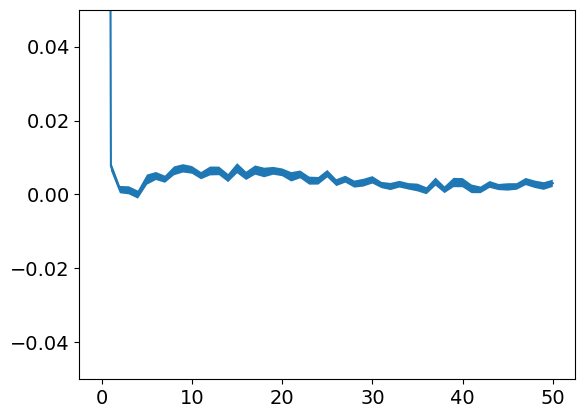

In [107]:
fig, ax = plt.subplots()
tmp_mua = epoch_acorr_dict["spi-peak"]["HYDO02"][2].sel(channel="20", lag=slice(0, 50))
tmp_sem = tmp_mua.std(dim="epoch") / np.sqrt(tmp_mua.sizes["epoch"])
ax.plot(
    tmp_mua.lag.values,
    tmp_mua.mean(dim="epoch"),
)
ax.fill_between(
    tmp_mua.lag.values,
    tmp_mua.mean(dim="epoch") + tmp_sem,
    tmp_mua.mean(dim="epoch") - tmp_sem,
)
ax.set_ylim([-0.05, 0.05])
# ax.set_yscale("log")

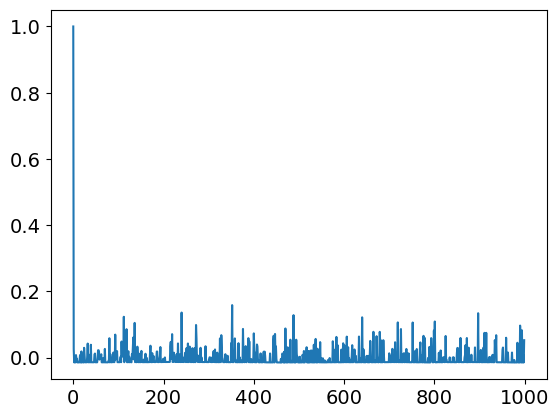

In [ ]:
def acf(x, length=1000):
    result = np.array(
        [1] + [np.corrcoef(x[:-i], x[i:])[0, 1] for i in range(1, length)]
    )
    return result[result.size // 2 :]

In [36]:
res = [
    np.correlate(
        tmp_data.isel(channel=0, trial=i),
        tmp_data.isel(channel=0, trial=i),
        mode="full",
    )
    for i in range(tmp_data.sizes["trial"])
]
tmp = np.asarray(res)
tmp = tmp[:, tmp.shape[1] // 2 :]

##### Load LFP Traces

In [ ]:
window = 5
sigma = 2.0

kernel = np.exp(-0.5 * (np.arange(window) - window // 2) ** 2 / sigma**2)
kernel /= kernel.sum()
tmp = (
    tmp_data.rolling(time=3, center=True)
    .construct("window")
    .dot(xr.DataArray(kernel, dims="window"))
)

AlignmentError: cannot reindex or align along dimension 'window' because of conflicting dimension sizes: {3, 5}

In [12]:
lfp_load_path = Path("/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/lfp_traces")
lfp_data_dict = {
    date: {reg: {trig: None for trig in triggers} for reg in ["hyp", "ctx"]}
    for date in trig_data_dict["none"].keys()
}
for date, date_data in lfp_data_dict.items():
    for region, reg_data in date_data.items():
        for trig, trig_data in reg_data.items():
            filename = f"{date}_{region}_{trig}_raw_6s_1.nc"
            tmp = xr.load_dataarray(Path(lfp_load_path, filename), engine="h5netcdf")
            tmp = tmp.assign_coords(
                time=np.array(
                    [np.timedelta64(int(val * 1e9), "ns") for val in tmp.time.values]
                )
            )
            lfp_data_dict[date][region][trig] = tmp
re_lfp_data_dict = {
    animal: {reg: {trig: [] for trig in triggers} for reg in ["hyp", "ctx"]}
    for animal in ["HYDO01", "HYDO02", "HYDO03", "HYDO04"]
}
for date, date_data in lfp_data_dict.items():
    animal = [
        animal
        for animal, tmp_date in zip(
            full_dict["none"]["animal"], full_dict["none"]["dates"]
        )
        if tmp_date == date
    ][0]
    for region, reg_data in date_data.items():
        for trig, trig_data in reg_data.items():
            re_lfp_data_dict[animal][region][trig].append(
                trig_data.groupby("epoch").mean(dim="trial")
            )

##### Plot Peri-Event activity averaged across Events By channel

15 not found in HYDO02 nrem-null
14 not found in HYDO02 nrem-null
15 not found in HYDO02 so-peak
14 not found in HYDO02 so-peak
15 not found in HYDO02 spi-peak
14 not found in HYDO02 spi-peak


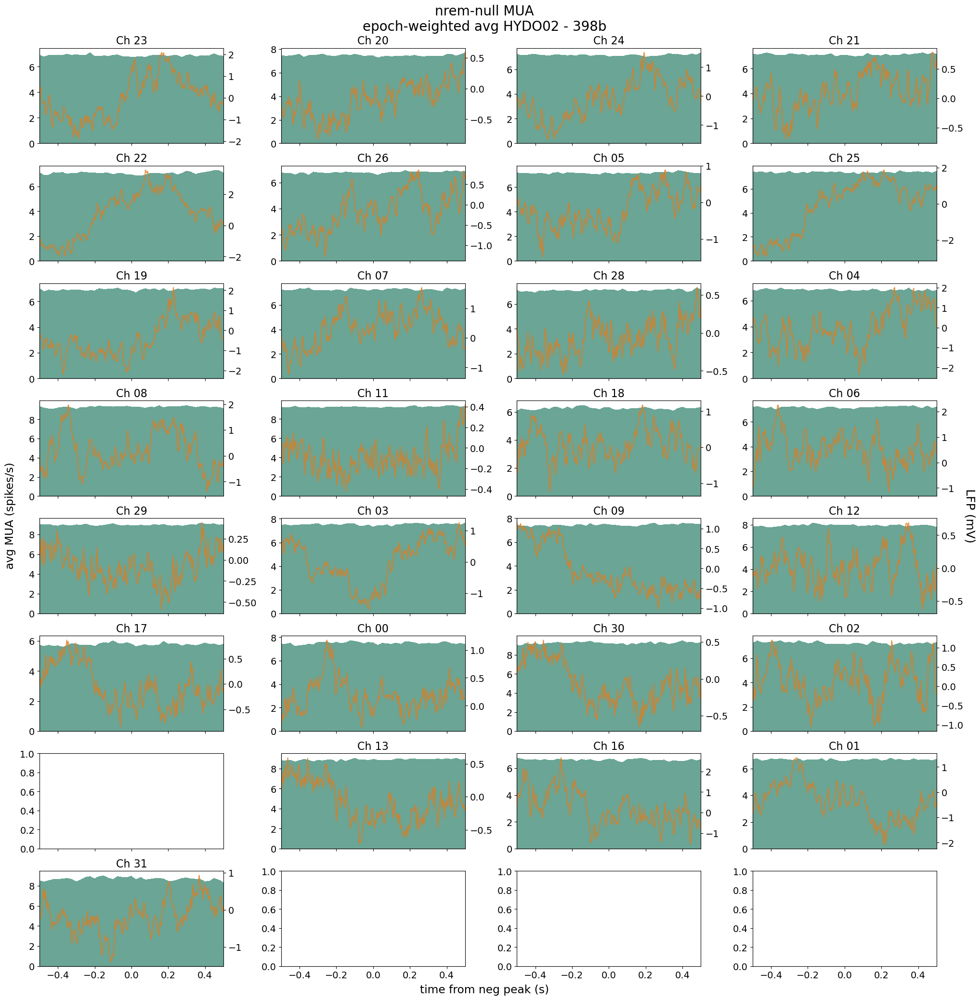

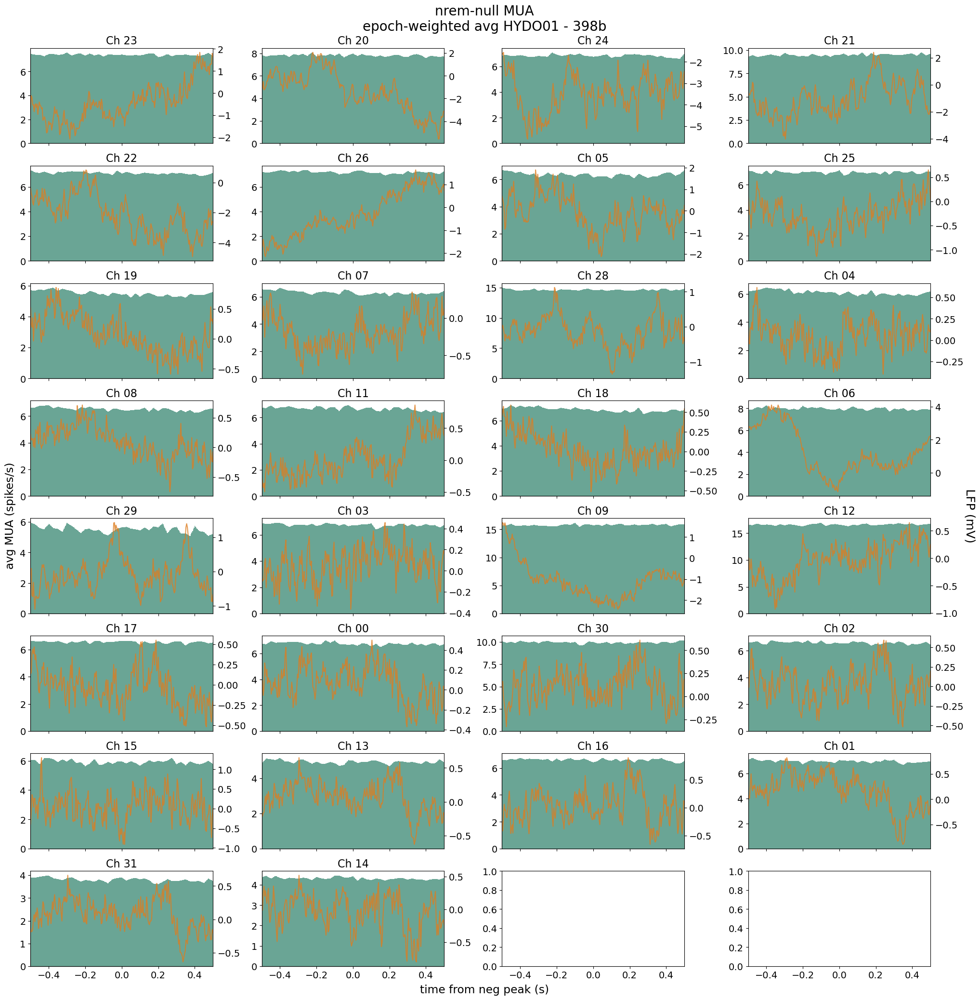

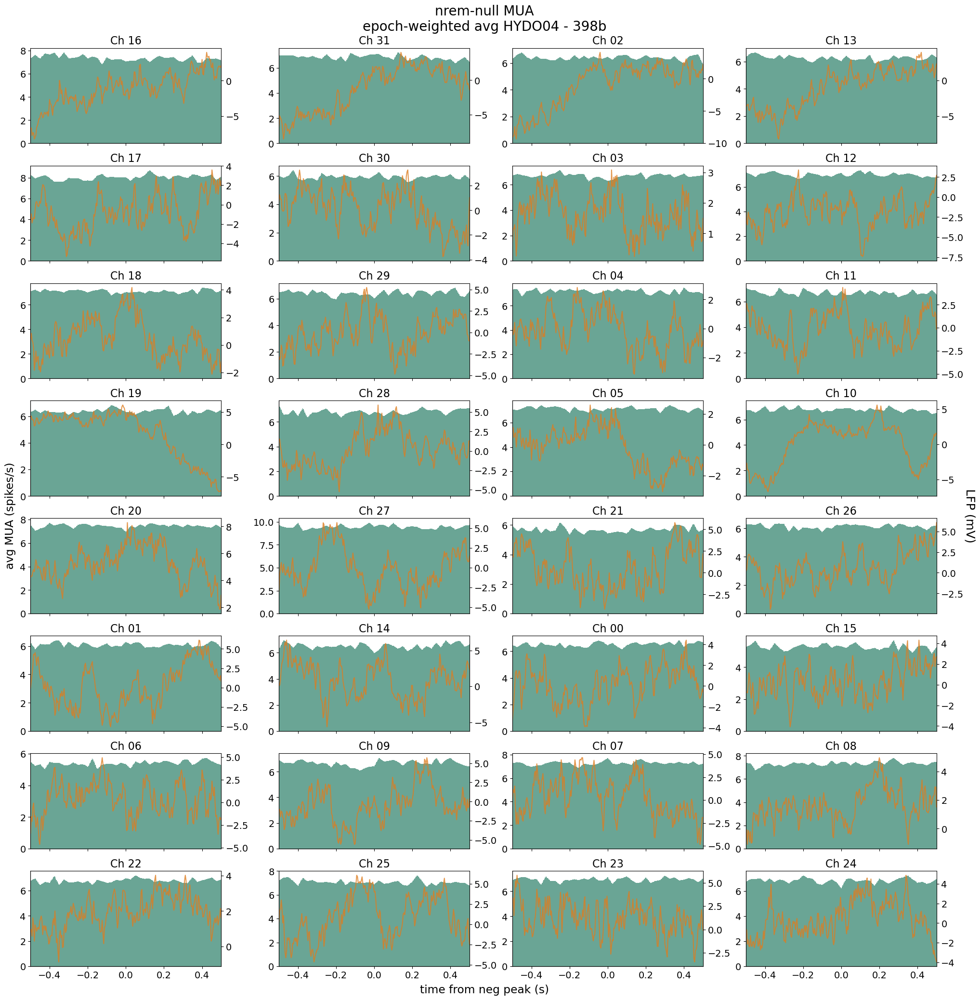

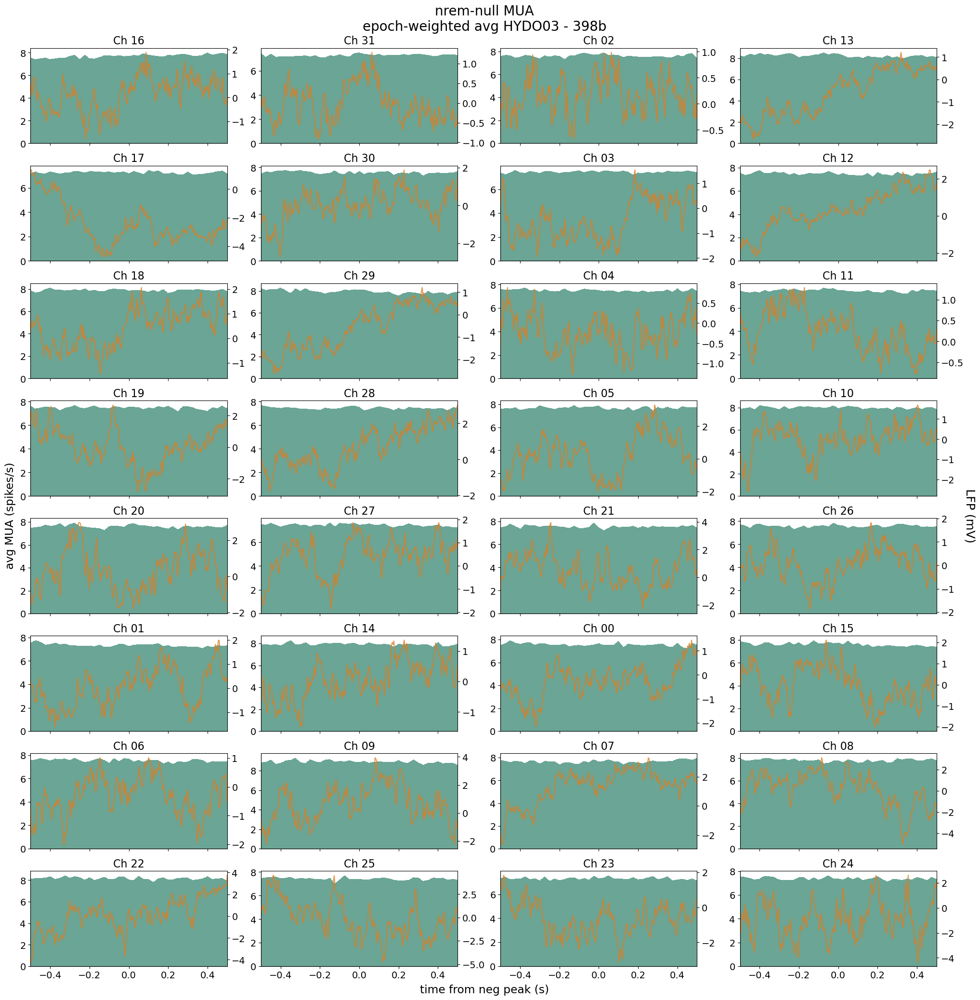

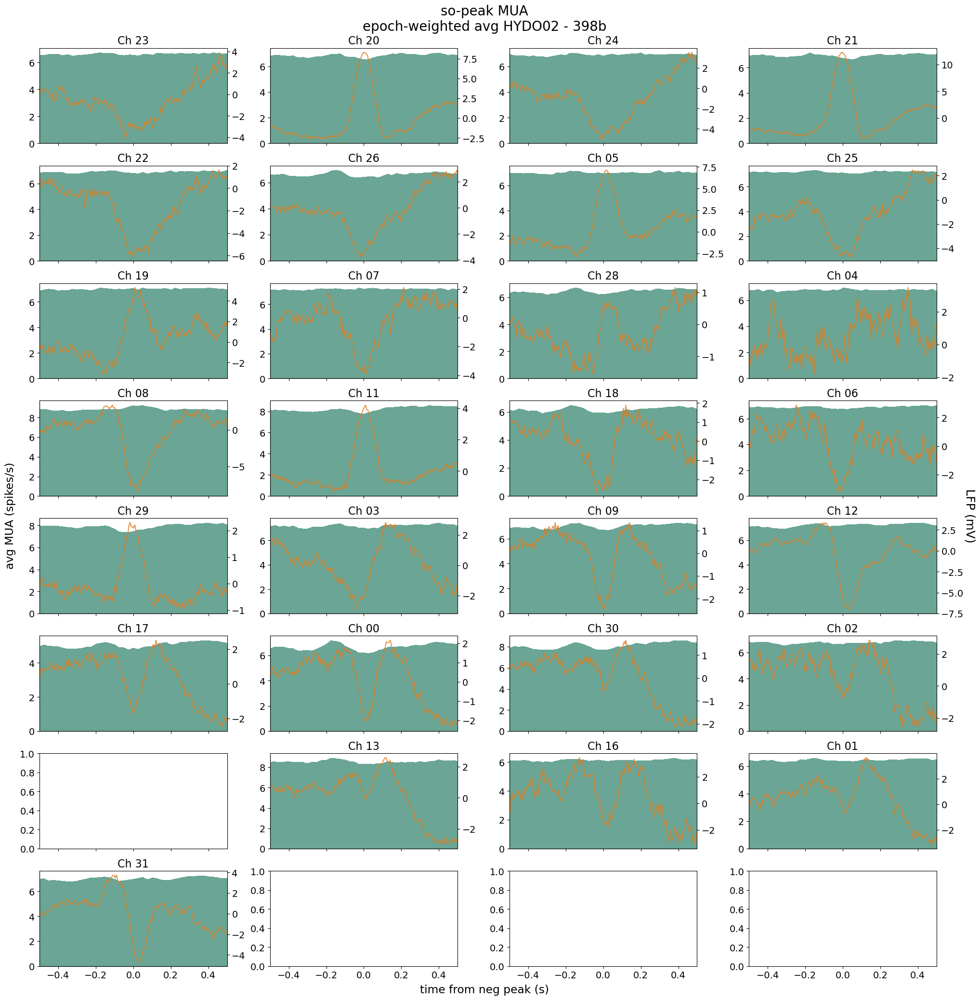

...

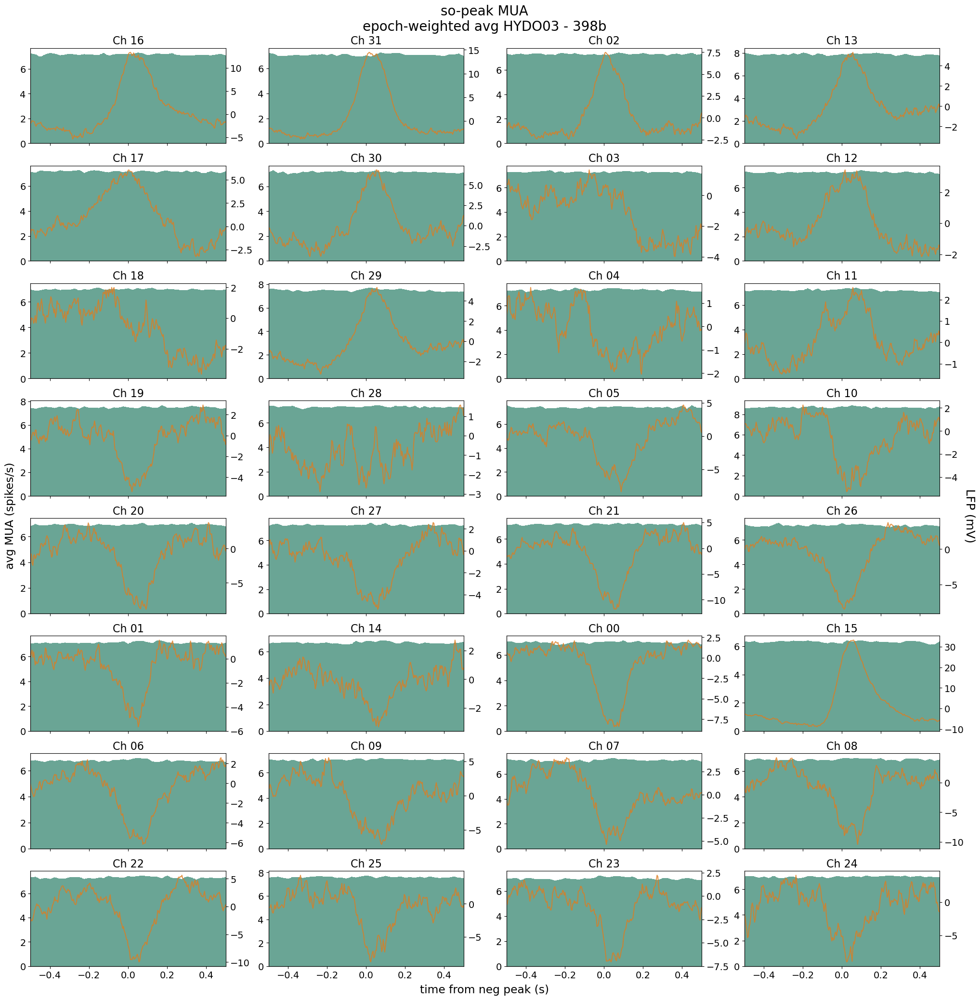

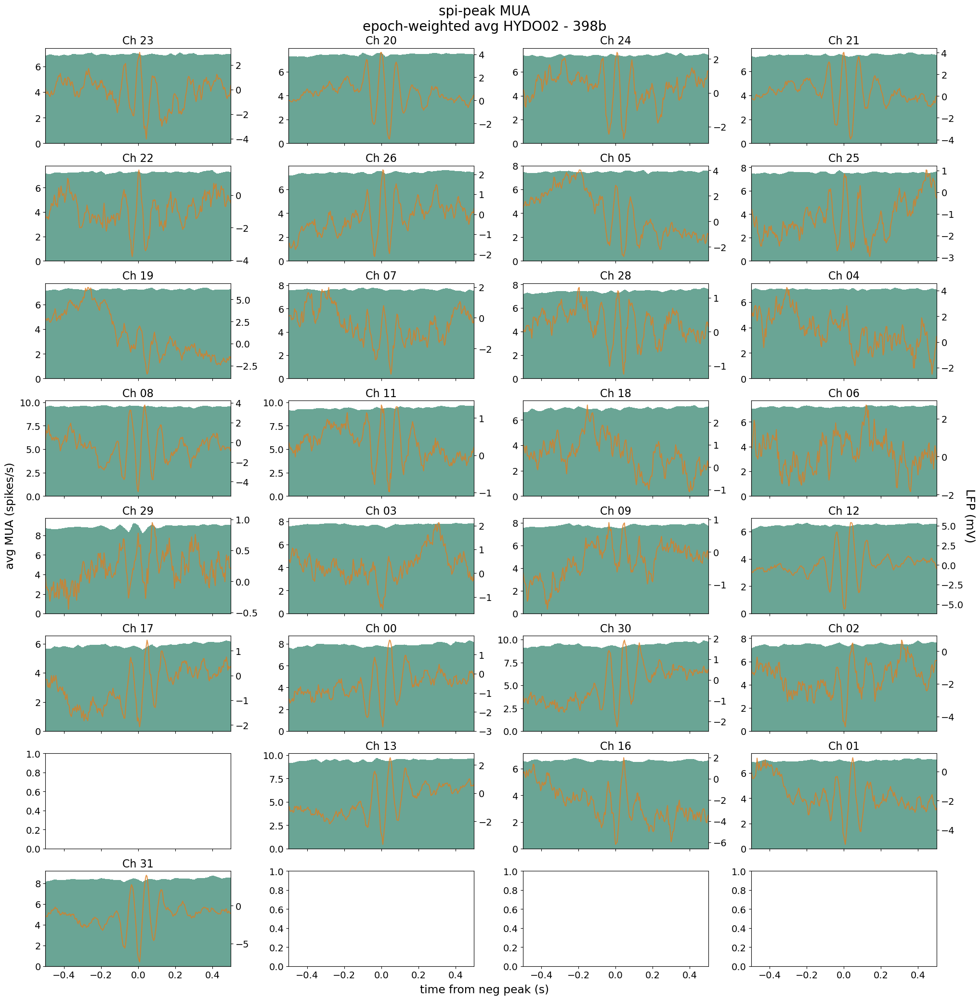

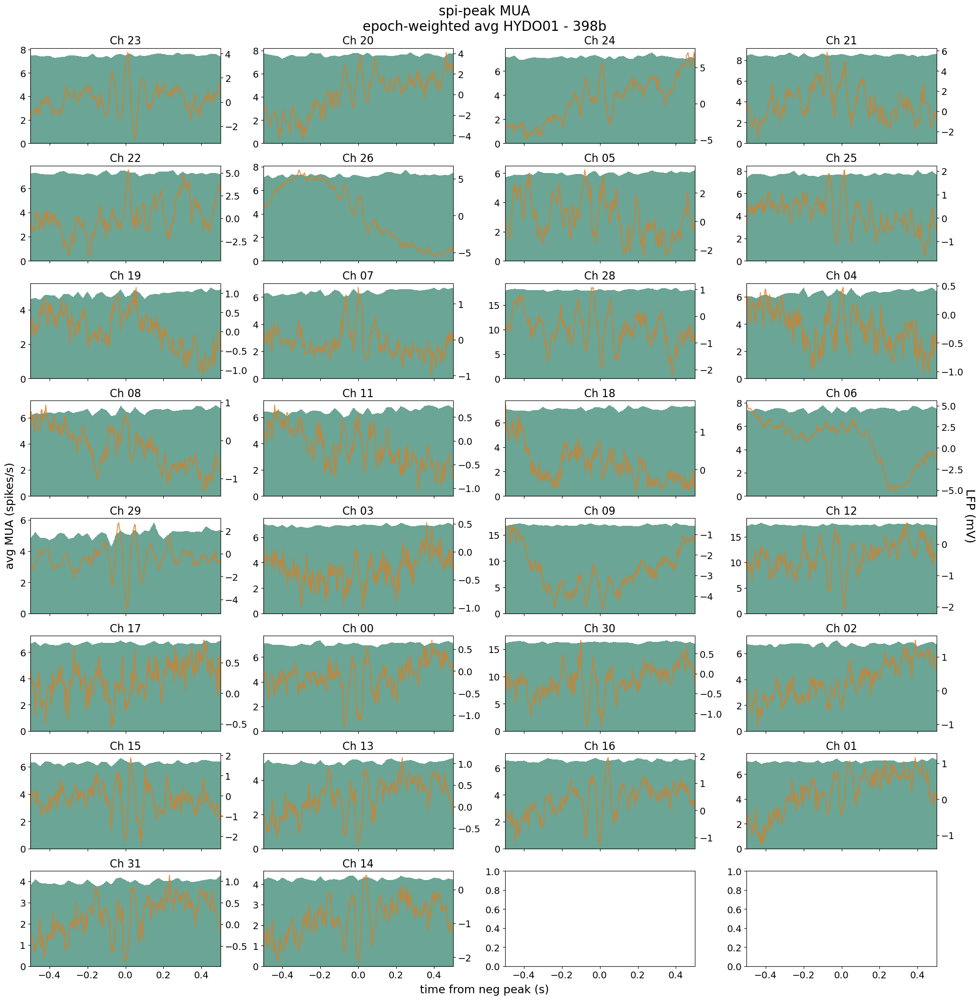

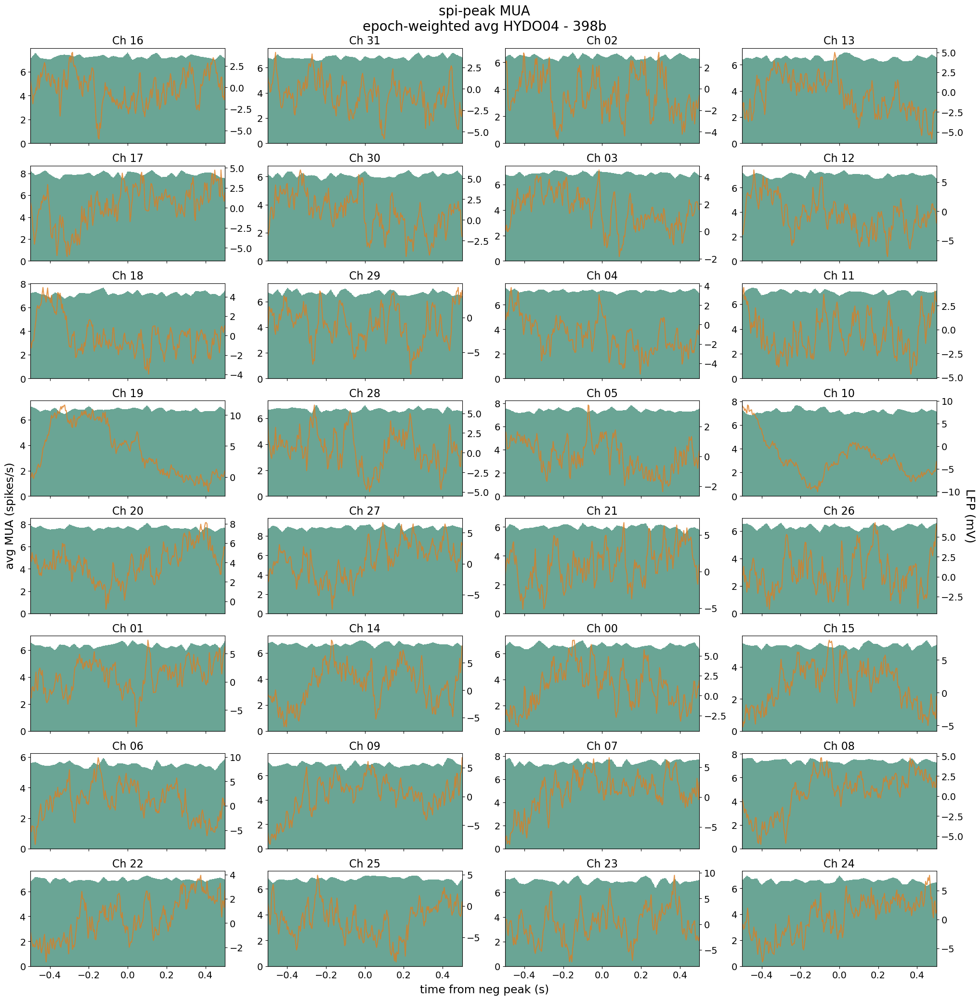

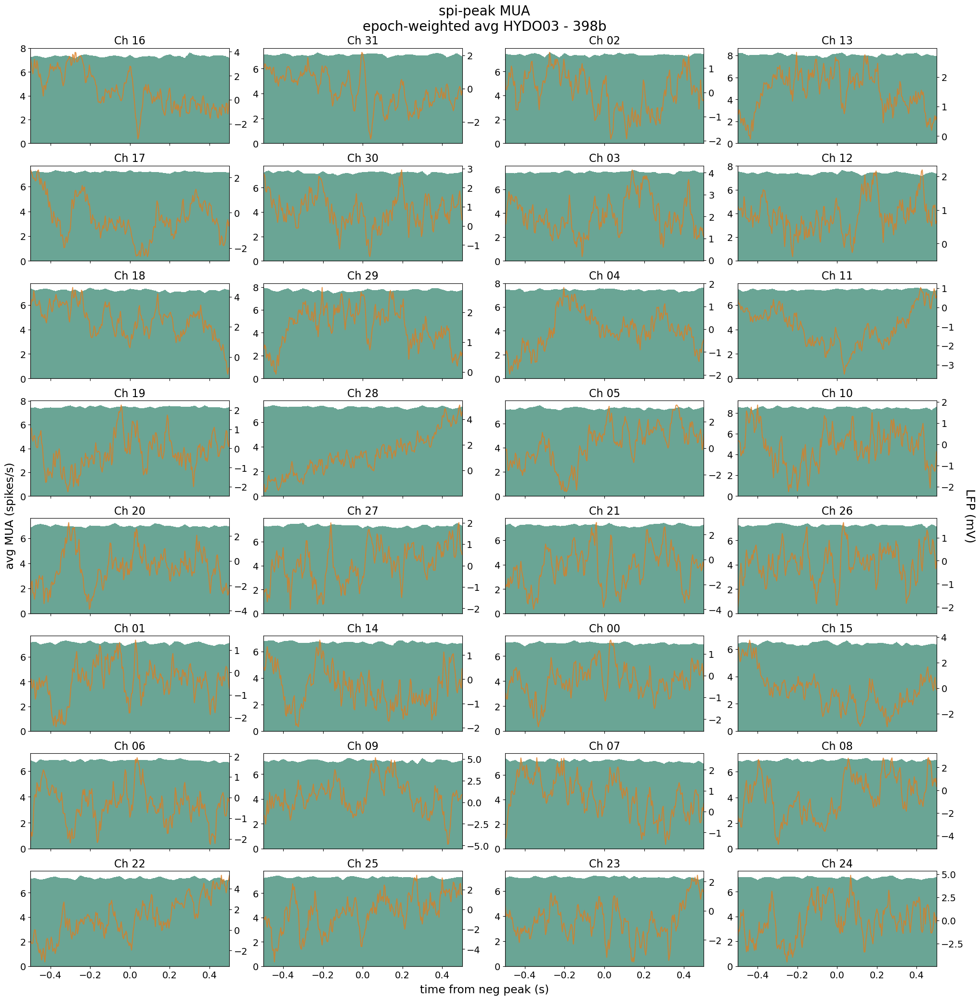

In [55]:
time_slice = slice(np.timedelta64(-500, "ms"), np.timedelta64(500, "ms"))
# time_lims = slice(-0.5, 0.5)
for trig, trig_mua in epoch_trig_dict.items():
    for animal, animal_mua in trig_mua.items():
        tmp_mua = xr.concat(animal_mua, dim="epoch")
        tmp_weights = xr.concat(epoch_weight_dict[trig][animal], dim="epoch")
        # tmp_mua = tmp_mua.resample(time="12ms").sum()
        fig, axs = plt.subplots(
            8, 4, figsize=(20, 20), sharex=True, sharey=False, constrained_layout=True
        )
        # lfp_axs = []
        for ax, tmp_ch in zip(axs.ravel(), depth_ordered_chs[animal][::-1]):
            if tmp_ch not in tmp_mua.channel.values:
                print(f"{tmp_ch} not found in {animal} {trig}")
                continue
            ch_mua = tmp_mua.sel(channel=tmp_ch, time=time_slice)
            ch_mean = ch_mua.weighted(tmp_weights).mean(dim="epoch")
            # ch_sem = ch_mua.std(dim="epoch") / np.sqrt(ch_mua.sizes["epoch"])
            plot_time = ch_mua.time.values.astype(float) / 1e9  # scale for ns -> s
            ax.bar(
                plot_time,
                ch_mean,
                width=0.004,  # 12ms bin width
                # yerr=ch_sem,
                alpha=0.6,
                color="#07694E",
            )
            ax2 = ax.twinx()
            # ax3 = ax.twinx()
            tmp_lfp = (
                xr.concat(re_lfp_data_dict[animal]["hyp"][trig], dim="epoch")
                .sel(channel=tmp_ch, time=time_slice)
                .mean(dim="epoch")
            )
            ax2.plot(
                tmp_lfp.time.values.astype(float) / 1e9,
                tmp_lfp.values,
                color="#dd7d21",
                alpha=0.8,
            )
            # tmp_ctx_lfp = (
            #     xr.concat(re_lfp_data_dict[animal]["ctx"][trig], dim="epoch")
            #     .sel(channel="39", time=time_slice)
            #     .mean(dim="epoch")
            # )
            # ax3.plot(
            #     tmp_ctx_lfp.time.values.astype(float) / 1e9,
            #     tmp_ctx_lfp.values,
            #     color="#dd7d21",
            #     ls="-",
            #     lw=2,
            #     alpha=1.0,
            # )
            # ax3.spines.right.set_position(("axes", 1.05))
            # ax3.spines[["top"]].set_visible(False)
            # lfp_axs.append(ax2)
            ax.set_title(f"Ch {int(tmp_ch):02d}")
            ax.spines[["top", "right"]].set_visible(False)
            ax.set_xlim([-0.5, 0.5])
            # ax.set_ylim([0, 0.3])
        # max_y = max([ax1.get_ylim()[1] for ax1 in lfp_axs])
        # min_y = min([ax1.get_ylim()[0] for ax1 in lfp_axs])
        # for ax1 in lfp_axs:
        #     ax1.set_ylim([int(np.floor(min_y)), int(np.ceil(max_y))])
        fig.suptitle(f"{trig} MUA\nepoch-weighted avg {animal} - {mua_config}", y=1.03)
        fig.supxlabel("time from neg peak (s)")
        fig.supylabel("avg MUA (spikes/s)")
        fig.text(
            x=0.99,
            y=0.5,
            s="LFP (mV)\n\n",
            size=18,
            rotation=270,
            ha="center",
            va="center",
        )
        fig.savefig(
            Path(
                "/gpfs01/born/animal/DanielG/hypo_sleep/figures/",
                f"{resamp_rate}_{animal}_{trig}_mua-{mua_config}_epoch_weighted_avg.png",
            ),
            dpi=500,
            bbox_inches="tight",
            facecolor="white",
            transparent=False,
        )

In [ ]:
time_slice = slice(np.timedelta64(-500, "ms"), np.timedelta64(500, "ms"))
# time_lims = slice(-0.5, 0.5)
for trig, trig_mua in epoch_trig_dict.items():
    for animal, animal_mua in trig_mua.items():
        tmp_mua = xr.concat(animal_mua, dim="epoch")
        tmp_mua = tmp_mua.resample(time="12ms").sum()
        fig, axs = plt.subplots(
            8, 4, figsize=(20, 20), sharex=True, sharey=False, constrained_layout=True
        )
        # lfp_axs = []
        for ax, tmp_ch in zip(axs.ravel(), depth_ordered_chs[animal][::-1]):
            if tmp_ch not in tmp_mua.channel.values:
                print(f"{tmp_ch} not found in {animal} {trig}")
                continue
            ch_mua = tmp_mua.sel(channel=tmp_ch, time=time_slice)
            ch_mean = ch_mua.mean(dim="epoch")
            ch_sem = ch_mua.std(dim="epoch") / np.sqrt(ch_mua.sizes["epoch"])
            plot_time = ch_mua.time.values.astype(float) / 1e9  # scale for ns -> s
            ax.bar(
                plot_time,
                ch_mean,
                width=0.012,  # 12ms bin width
                # yerr=ch_sem,
                alpha=0.6,
                color="#07694E",
            )
            # ax2 = ax.twinx()
            ax3 = ax.twinx()
            # tmp_lfp = (
            #     xr.concat(re_lfp_data_dict["HYDO03"]["hyp"][trig], dim="epoch")
            #     .sel(channel=tmp_ch, time=time_slice)
            #     .mean(dim="epoch")
            # )
            # # ax2.plot(tmp_lfp.time.values, tmp_lfp.values, color="#dd7d21", alpha=0.8)
            tmp_ctx_lfp = (
                xr.concat(re_lfp_data_dict[animal]["ctx"][trig], dim="epoch")
                .sel(channel="39", time=time_slice)
                .mean(dim="epoch")
            )
            ax3.plot(
                tmp_ctx_lfp.time.values.astype(float) / 1e9,
                tmp_ctx_lfp.values,
                color="#dd7d21",
                ls="-",
                lw=2,
                alpha=1.0,
            )
            ax3.spines.right.set_position(("axes", 1.05))
            ax3.spines[["top"]].set_visible(False)
            # lfp_axs.append(ax2)
            ax.set_title(f"Ch {int(tmp_ch):02d}")
            ax.spines[["top", "right"]].set_visible(False)
            ax.set_xlim([-0.5, 0.5])
            # ax.set_ylim([0, 0.3])
        # max_y = max([ax1.get_ylim()[1] for ax1 in lfp_axs])
        # min_y = min([ax1.get_ylim()[0] for ax1 in lfp_axs])
        # for ax1 in lfp_axs:
        #     ax1.set_ylim([int(np.floor(min_y)), int(np.ceil(max_y))])
        fig.suptitle(f"{trig} MUA\nepoch-avg {animal}", y=1.03)
        fig.supxlabel("time from neg peak (s)")
        fig.supylabel("avg MUA (spikes/s)")
        # fig.savefig(
        #     Path(
        #         "/gpfs01/born/animal/DanielG/hypo_sleep/figures/",
        #         f"{animal}_{trig}_mua_epoch_avg.png",
        #     ),
        #     dpi=500,
        #     bbox_inches="tight",
        #     facecolor="white",
        #     transparent=False,
        # )

##### Calculate Autocorrelation

In [17]:
acorr_dict = {trig: {ch: {} for ch in depth_ordered_chs[::-1]} for trig in triggers}
time_slice = slice(np.timedelta64(-2000, "ms"), np.timedelta64(2000, "ms"))
for trig, trig_mua in epoch_trig_dict.items():
    epoch_mua = xr.concat(trig_mua["HYDO03"], dim="epoch")
    # epoch_mua = tmp_mua.resample(time="12ms").sum()
    for tmp_ch in depth_ordered_chs[::-1]:
        ch_mua = epoch_mua.sel(channel=tmp_ch, time=time_slice)
        acorrs = []
        ci_list = []
        for i_epoch in range(ch_mua.epoch.values.size):
            tmp_acorr, tmp_ci = sm.tsa.acf(
                ch_mua.isel(epoch=i_epoch),
                nlags=ch_mua.time.size,
                alpha=0.05,
                adjusted=True,
            )
            # signal.correlate(
            #     ch_mua.isel(epoch=i_epoch), ch_mua.isel(epoch=i_epoch), mode="full"
            # )
            # tmp_acorr = tmp_acorr[tmp_acorr.size // 2 :]
            if np.isnan(tmp_acorr).sum() == tmp_acorr.size:
                continue
            acorrs.append(tmp_acorr)
            ci_list.append(tmp_ci)
        acorr_dict[trig][tmp_ch]["acf"] = np.stack(acorrs)
        acorr_dict[trig][tmp_ch]["ci"] = np.stack(ci_list)

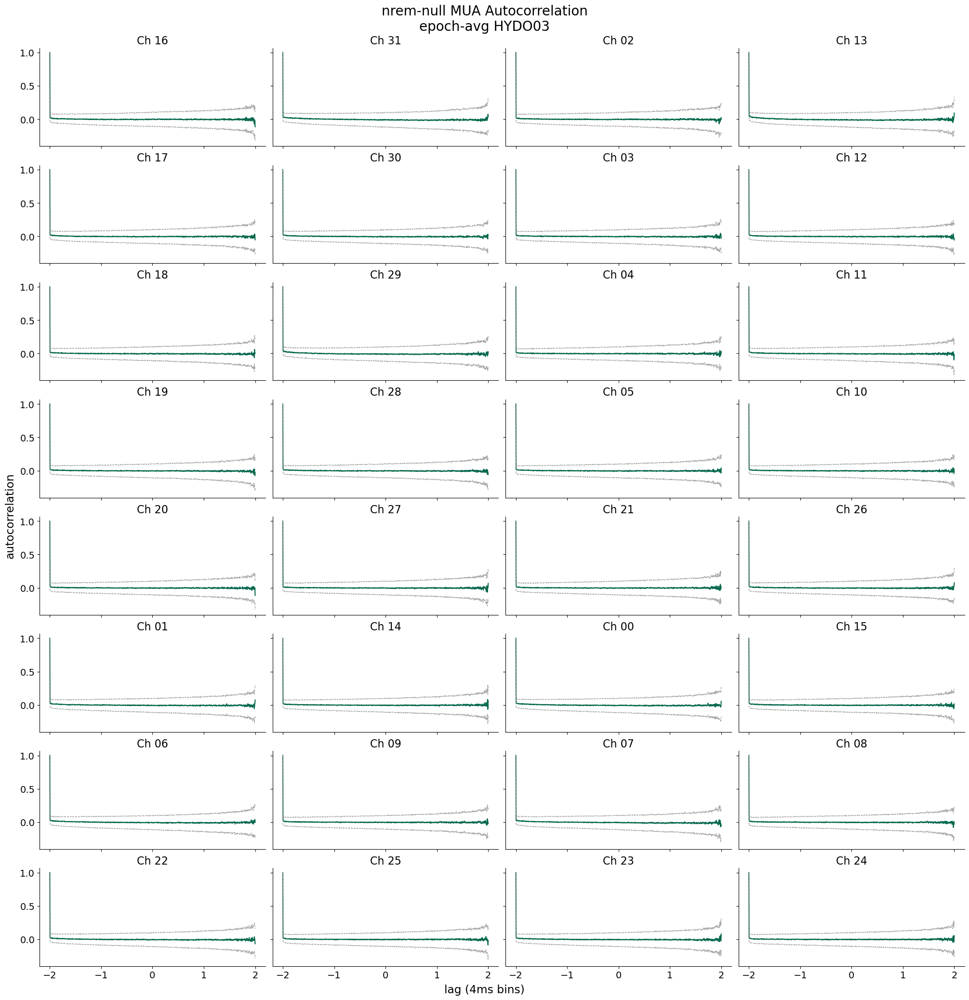

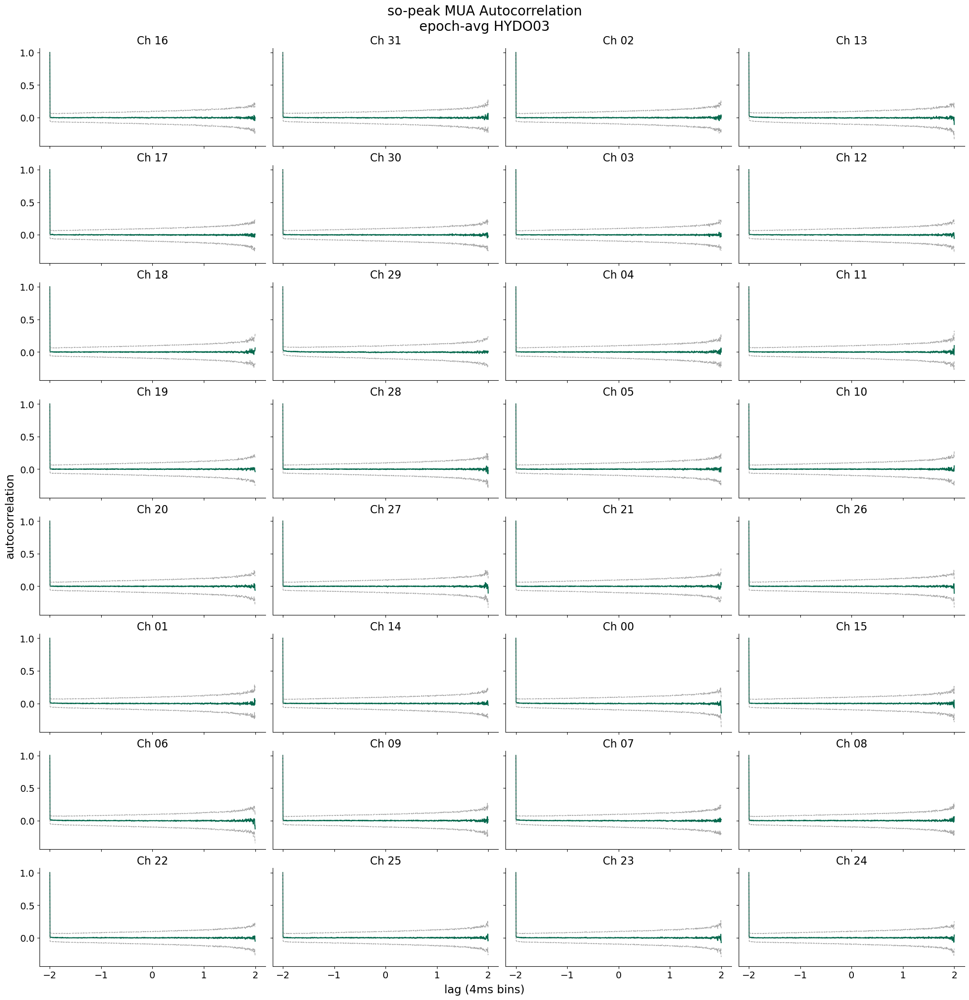

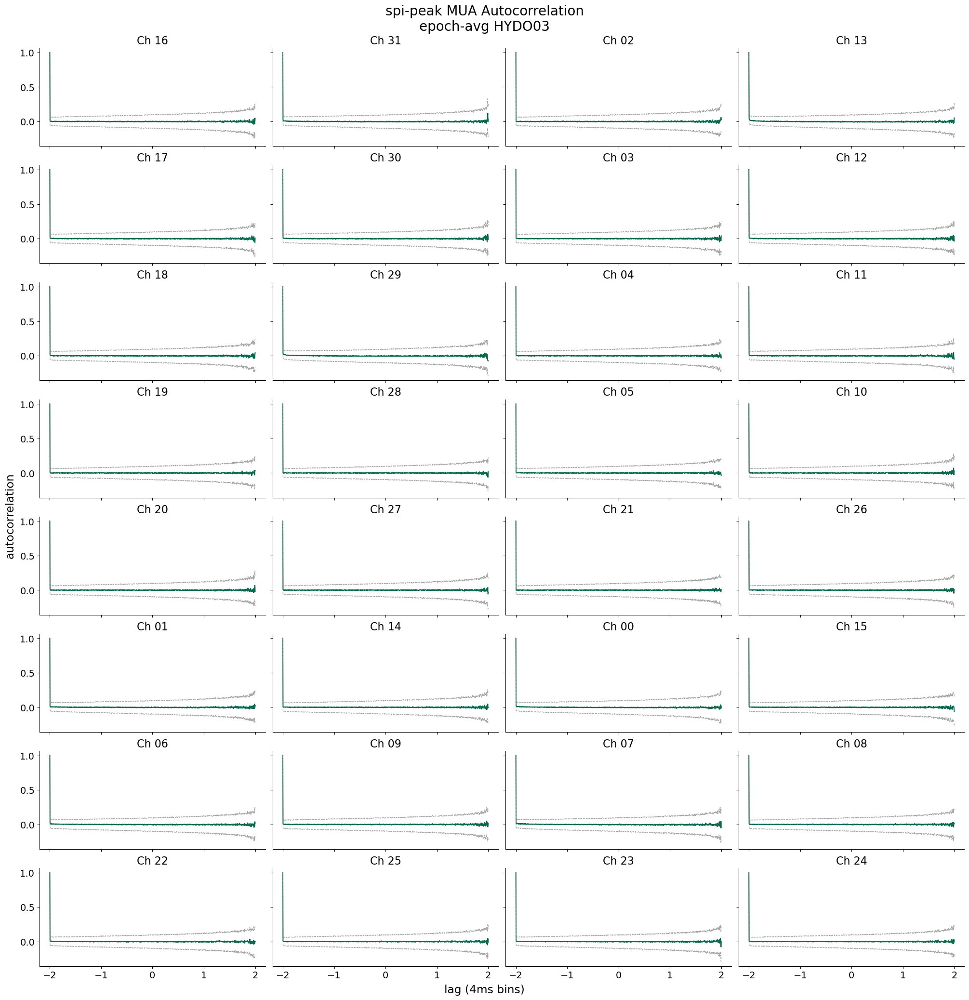

In [23]:
for trig, trig_acf in acorr_dict.items():
    fig, axs = plt.subplots(
        8, 4, figsize=(20, 20), sharex=True, sharey=True, constrained_layout=True
    )
    for ax, (tmp_ch, ch_acf) in zip(axs.ravel(), trig_acf.items()):
        mean_acf = ch_acf["acf"].mean(axis=0)
        std_acf = ch_acf["acf"].std(axis=0)
        ax.plot(
            ((np.arange(mean_acf.size) * 4) / 1000) - 2,
            mean_acf,
            color="#07694E",
        )
        ax.plot(
            ((np.arange(mean_acf.size) * 4) / 1000) - 2,
            ch_acf["ci"].mean(axis=0)[:, 0],
            color="gray",
            ls="--",
            lw=1,
            alpha=0.7,
        )
        ax.plot(
            ((np.arange(mean_acf.size) * 4) / 1000) - 2,
            ch_acf["ci"].mean(axis=0)[:, 1],
            color="gray",
            ls="--",
            lw=1,
            alpha=0.7,
        )
        # ax.fill_between(
        #     ((np.arange(mean_acf.size) * 4) / 1000) - mean_acf.size // 2,
        #     mean_acf - std_acf,
        #     mean_acf + std_acf,
        #     color="#07694E",
        #     alpha=0.3,
        # )
        ax.set_title(f"Ch {int(tmp_ch):02d}")
        ax.spines[["top", "right"]].set_visible(False)
    fig.suptitle(f"{trig} MUA Autocorrelation\nepoch-avg HYDO03", y=1.03)
    fig.supxlabel("lag (4ms bins)")
    fig.supylabel("autocorrelation")

<function statsmodels.tsa.stattools.acf(x, adjusted=False, nlags=None, qstat=False, fft=True, alpha=None, bartlett_confint=True, missing='none')>

In [21]:
time_slice = slice(np.timedelta64(-500, "ms"), np.timedelta64(500, "ms"))
time_lims = slice(-0.5, 0.5)
for trig, trig_mua in epoch_trig_dict.items():
    if trig == "nrem-null":
        continue
    trig_lfp = xr.concat(re_lfp_data_dict["HYDO03"]["hyp"][trig], dim="epoch")
    trig_eeg = xr.concat(re_lfp_data_dict["HYDO03"]["ctx"][trig], dim="epoch")
    trig_cat_mua = xr.concat(trig_mua["HYDO03"], dim="epoch")
    null_epochs = [
        epoch
        for epoch in range(trig_cat_mua.epoch.size)
        if trig_cat_mua.isel(epoch=epoch).isnull().sum()
        == trig_cat_mua.isel(epoch=epoch).size
    ]
    trig_cat_mua = trig_cat_mua.drop_isel(epoch=null_epochs)
    tmp_mua = trig_cat_mua.isel(epoch=slice(trig_lfp.epoch.size)).sel(
        channel=depth_ordered_chs[::-1], time=time_slice
    )
    tmp_lfp = trig_lfp.isel(epoch=slice(trig_cat_mua.epoch.size)).sel(
        channel=depth_ordered_chs[::-1], time=time_slice
    )
    tmp_eeg = trig_eeg.isel(epoch=slice(trig_cat_mua.epoch.size)).sel(
        channel="39", time=time_slice
    )
    # for tmp_epoch in range(trig_cat_mua.epoch.size):
    #     print(tmp_epoch)
    #     tmp_mua = trig_cat_mua.isel(epoch=tmp_epoch).sel(
    #         channel=depth_ordered_chs[::-1], time=time_slice
    #     )
    #     tmp_lfp = trig_lfp.isel(epoch=epoch).sel(channel="39", time=time_slice)
    tmp_data = prepare_time_series(xr.concat([tmp_eeg, tmp_lfp], dim="channel"))
    break
    group_labels = ["ctx"] + ["hyp"] * len(depth_ordered_chs)
    mtm = Multitaper(
        time_series=tmp_data,
        sampling_frequency=250,
        time_halfbandwidth_product=3,
        time_window_duration=0.12,
        time_window_step=0.08,
    )
    c = Connectivity.from_multitaper(mtm)
    canon_coh, pair_labels = c.canonical_coherence(group_labels=group_labels)
    coh_mag = multitaper_connectivity(
        time_series=tmp_data,
        sampling_frequency=250,
        time_halfbandwidth_product=3,
        time_window_duration=0.08,
        time_window_step=0.08,
        method="coherence_magnitude",
    )

In [ ]:
group_labels = ["ctx"] + ["hyp"] * len(depth_ordered_chs)
mtm = Multitaper(
    time_series=tmp_data,
    sampling_frequency=250,
    time_halfbandwidth_product=5,
    time_window_duration=0.12,
    time_window_step=0.04,
)
conn = Connectivity.from_multitaper(mtm)
canon_coh, pair_labels = c.canonical_coherence(group_labels=group_labels)

(23, 30, 1)


Text(0, 0.5, 'Frequency [Hz]')

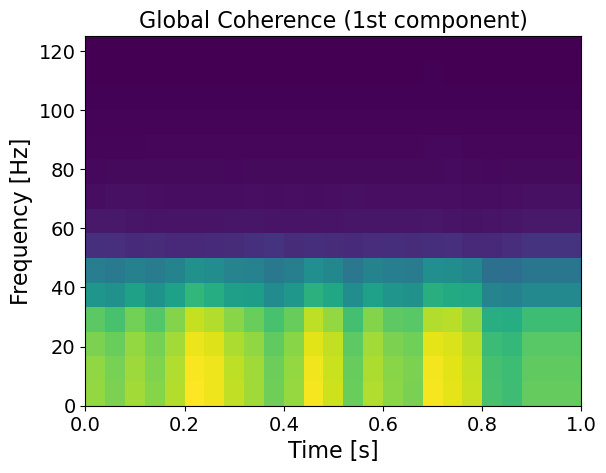

In [ ]:
global_coherence, unnormalized_global_coherence = conn.global_coherence()
print(global_coherence.shape)  # n_time, n_frequencies, n_components

# Extract non-negative frequencies (first N//2+1 frequencies)
n_nonneg_freqs = len(conn.frequencies)
global_coherence_nonneg = global_coherence[:, :n_nonneg_freqs, 0].T  # (freqs, time)

time_grid, freq_grid = np.meshgrid(
    np.append(conn.time, 1.0),
    np.append(conn.frequencies, conn.frequencies[-1]),  # Add edge for pcolormesh
)
plt.figure()
plt.pcolormesh(
    time_grid,
    freq_grid,
    global_coherence_nonneg,
    shading="flat",
)
plt.title("Global Coherence (1st component)")
plt.xlabel("Time [s]")
plt.ylabel("Frequency [Hz]")

In [ ]:
dtf = conn.direct_directed_transfer_function()

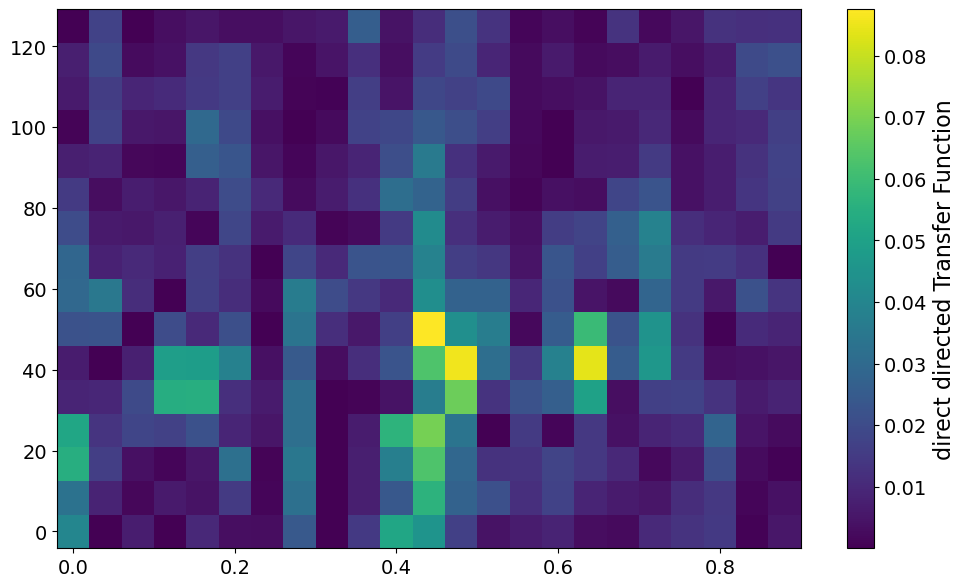

In [ ]:
fig, ax = plt.subplots(figsize=(12, 7))
h1 = ax.pcolormesh(conn.time, conn.frequencies, dtf[..., :, 0, 6].T, cmap="viridis")
fig.colorbar(h1, ax=ax, label="direct directed Transfer Function")

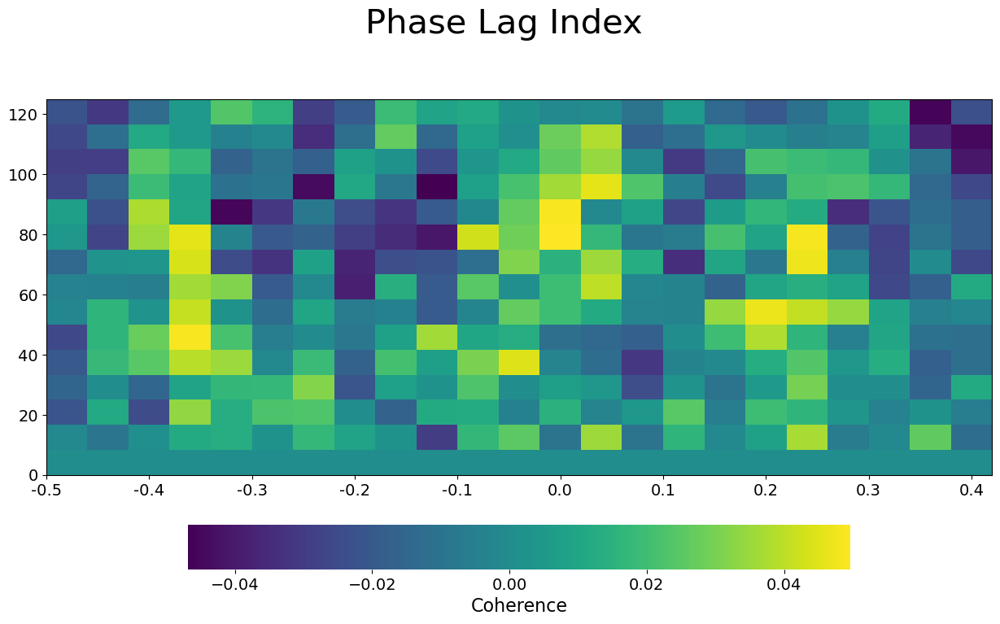

In [ ]:
fig, ax = plt.subplots(figsize=(15, 8))
time_grid, freq_grid = np.meshgrid(
    np.append(c.time, 0.92),
    np.append(c.frequencies, mtm.nyquist_frequency),
)

mesh = plt.pcolormesh(
    time_grid,
    freq_grid,
    # canon_coh[..., 0, 1].squeeze().T,
    conn.phase_lag_index()[..., 0, 1].squeeze().T,
    # vmin=0,
    # vmax=0.5,
    cmap="viridis",
)
# plt.suptitle("Canonical Coherence", y=1.02, fontsize=30)
plt.suptitle("Phase Lag Index", y=1.02, fontsize=30)
cb = fig.colorbar(
    mesh,
    ax=plt.gca(),
    orientation="horizontal",
    shrink=0.7,
    aspect=15,
    pad=0.1,
    label="Coherence",
)
ax.set_xticks(
    np.arange(0, 1.0, 0.1),
    labels=[f"{val:.1f}" for val in np.arange(0, 1.0, 0.1) - 0.5],
)
ax.set_xlim([0, 0.92])
cb.outline.set_linewidth(0)

In [22]:
group_labels = ["ctx"] + ["hyp"] * len(depth_ordered_chs)
m = multitaper_connectivity(
    time_series=tmp_data,
    sampling_frequency=250,
    time_halfbandwidth_product=3,
    time_window_duration=0.5,
    time_window_step=0.1,
    method=["coherence_magnitude", "coherence_phase"],
)

In [ ]:
tmp = m.coherence_magnitude

(<xarray.plot.facetgrid.FacetGrid at 0x7fef4ba02d80>,)

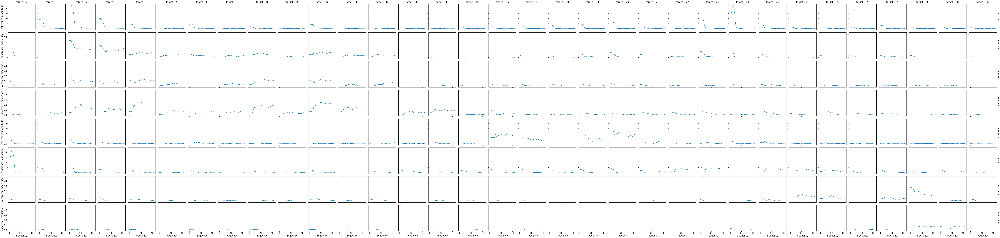

In [26]:
# tmp = m.coherence_magnitude
tmp.sel(
    source=["0", "1", "6", "12", "18", "24", "28", "32"], frequency=slice(0, 45)
).mean(dim="time").plot(
    col="target", row="source", x="frequency"
),  # vmin=0, vmax=0.03)

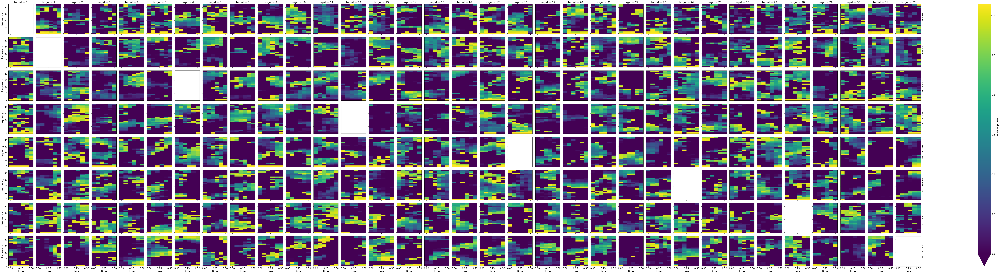

In [18]:
m.coherence_phase.sel(
    source=["0", "1", "6", "12", "18", "24", "28", "32"], frequency=slice(0, 45)
).plot(col="target", row="source", x="time", vmin=0, vmax=np.pi)

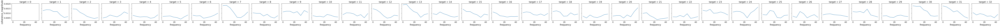

In [ ]:
m.coherence_magnitude.sel(source=["0"], frequency=slice(0, 45)).mean(dim="time").plot(
    x="frequency", col="target"
)

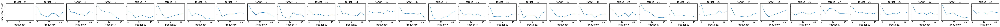

In [ ]:
m.coherence_phase.sel(source=["0"], frequency=slice(0, 45)).mean(dim="time").plot(
    x="frequency", col="target"
)

In [37]:
from tensorpac import EventRelatedPac

p = EventRelatedPac(f_pha=[0.5, 45], f_amp=(1, 120, 2, 1))

Event Related PAC object defined


In [43]:
tmp_ch = depth_ordered_chs[::-1][0]
phase_signal = tmp_lfp.T
amp_signal = tmp_mua.sel(channel=tmp_ch)

In [61]:
mcp = "bonferroni"
erpac = p.filterfit(
    250, x_amp=phase_signal, x_pha=amp_signal, method="gc", n_perm=1000, mcp=mcp
)

    Extract phases (n_pha=1) and amplitudes (n_amps=117)
    Compute Gaussian-Copula ERPAC
    Compute 1000 permutations
    infer p-values at (p=0.05, mcp=maxstat)


<Axes: >

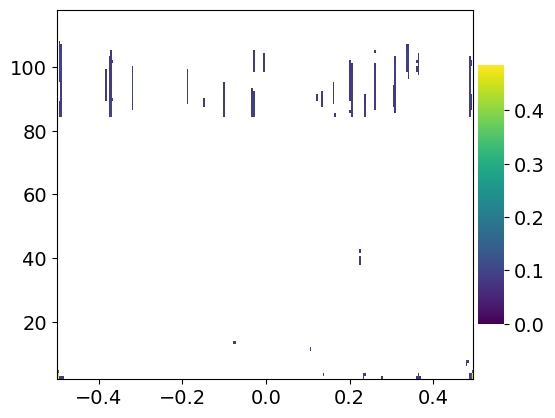

In [62]:
pvals = p.pvalues
erpac[pvals > 0.05] = np.nan
p.pacplot(erpac.squeeze(), np.arange(-0.5, 0.5, 0.004), p.yvec)

In [ ]:
time_slice = slice(np.timedelta64(-1, "s"), np.timedelta64(1, "s"))
for trig, trig_mua in epoch_trig_dict.items():
    tmp_mua = xr.concat(trig_mua["HYDO03"], dim="epoch")
    fig, axs = plt.subplots(
        8, 4, figsize=(20, 20), sharex=True, sharey=True, constrained_layout=True
    )
    for ax, tmp_ch in zip(axs.ravel(), depth_ordered_chs[::-1]):
        ch_mua = tmp_mua.sel(channel=tmp_ch, time=time_slice)
        ch_mean = ch_mua.mean(dim="epoch")
        ch_sem = ch_mua.std(dim="epoch") / np.sqrt(ch_mua.sizes["epoch"])
        plot_time = ch_mua.time.values.astype(float) / 1e9
        ax.bar(
            plot_time,
            ch_mean,
            width=plot_time[1] - plot_time[0],
            yerr=ch_sem,
            alpha=0.6,
            color="#07694E",
        )
        ax.set_title(f"Ch {int(tmp_ch):02d}")
        ax.spines[["top", "right"]].set_visible(False)
        ax.set_xlim([-1, 1])
        ax.set_ylim([0, 0.2])
    fig.suptitle(f"{trig} MUA\nepoch-avg HYDO03", y=1.03)
    fig.supxlabel("time from neg peak (s)")
    fig.supylabel("avg MUA (spikes/s)")

In [ ]:
frames = []
for trig, trig_psd in epoch_trig_dict.items():
    for animal, anim_psd in trig_psd.items():
        anim_psd = xr.concat(anim_psd, dim="epoch")
        df = anim_psd.sel(freq=slice(0, 45)).to_dataframe(name="value").reset_index()
        df.freq = np.round(df.freq, 1)
        df["trig"] = trig
        df["animal"] = animal

        frames.append(df)
df_all = pd.concat(frames, ignore_index=True)
ch_mean_df = (
    df_all.groupby(["freq", "trig", "animal", "epoch"])
    .agg({"value": np.nanmean})
    .reset_index()
)

In [ ]:
df_all.to_xarray().to_netcdf(
    Path("/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/mua_event-trig_psd.nc"),
    mode="w",
)

In [ ]:
ch_mean_df = ch_mean_df[ch_mean_df.value.notnull()]

In [ ]:
idx = pd.IndexSlice
freqs = ch_mean_df.freq.unique()
stat_res = {}
for tmp_freq in freqs[1:]:
    tmp_df = ch_mean_df.loc[(ch_mean_df.freq == tmp_freq), :]
    model1 = sm.formula.mixedlm(
        "value ~ C(trig, Treatment(reference='nrem-null'))",
        data=tmp_df,
        groups=tmp_df.animal,
    ).fit(reml=False, **{"maxiter": 2000})
    model2 = sm.formula.mixedlm(
        "value ~ 1",
        data=tmp_df,
        groups=tmp_df.animal,
    ).fit(reml=False, **{"maxiter": 2000})
    chi_sq_1_2 = 2 * (model1.llf - model2.llf)
    df_1_2 = model1.df_modelwc - model2.df_modelwc
    p_value_1_2 = stats.chi2.sf(chi_sq_1_2, df_1_2)
    if p_value_1_2 < 0.05:
        model = model1
    else:
        model = model2
    stat_res[f"{tmp_freq:.01f}"] = {
        "model": model,
        "p_value": p_value_1_2,
    }

/gpfs01/born/user/dgramling/miniforge3/envs/hypo-sleep/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/gpfs01/born/user/dgramling/miniforge3/envs/hypo-sleep/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/gpfs01/born/user/dgramling/miniforge3/envs/hypo-sleep/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/gpfs01/born/user/dgramling/miniforge3/envs/hypo-sleep/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(
/gpfs01/born/user/dgramling/miniforge3/envs/h

In [ ]:
trig_df = df_all.groupby(["freq", "trig"]).agg({"value": ["mean", "sem"]}).reset_index()

<>:33: SyntaxWarning: invalid escape sequence '\l'
<>:33: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_504581/3049775327.py:33: SyntaxWarning: invalid escape sequence '\l'
  ax.set_ylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$")


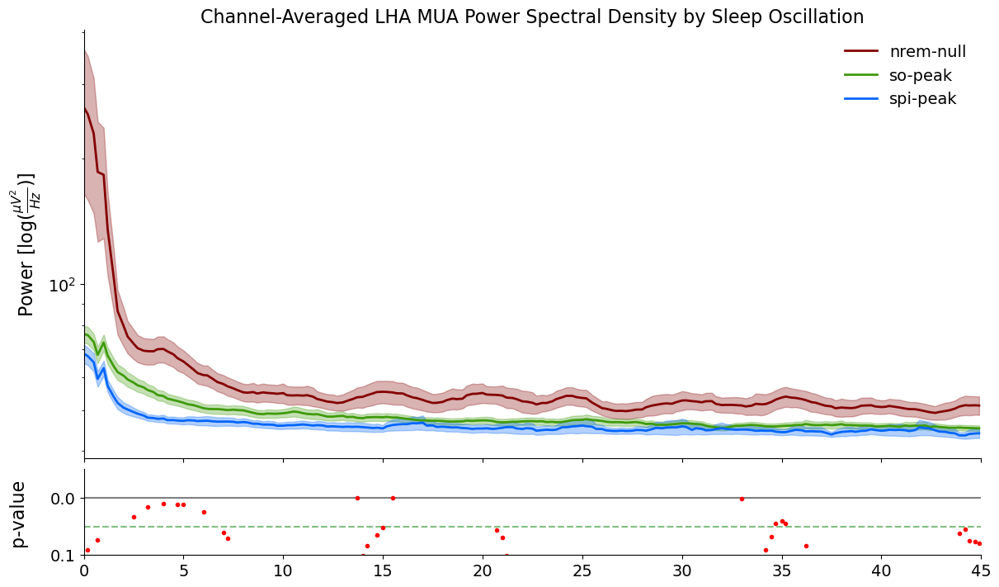

In [ ]:
trig_color_dict = {"spi-peak": "#0165fc", "so-peak": "#3f9b0b", "nrem-null": "#840000"}
region = "hyp"
fig, axs = plt.subplots(
    nrows=2,
    figsize=(12, 7),
    constrained_layout=True,
    height_ratios=[5, 1],
    sharex=True,
)
ax = axs[0]
for trig, trig_df_group in trig_df.groupby("trig"):
    ax.plot(
        trig_df_group.freq,
        trig_df_group.value["mean"],
        label=trig,
        c=trig_color_dict[trig],
        lw=2,
    )
    ax.fill_between(
        x=trig_df_group.freq,
        y1=trig_df_group.value["mean"] - trig_df_group.value["sem"],
        y2=trig_df_group.value["mean"] + trig_df_group.value["sem"],
        color=trig_color_dict[trig],
        alpha=0.3,
    )
    ax.set_yscale("log")
    # ax.set_xscale("log")
ax.set_xlim([0, 45])
# ax.set_ylim([10e-2, 10e3])
ax.legend(frameon=False)
ax.spines[["top", "right"]].set_visible(False)
ax.set_title("Channel-Averaged LHA MUA Power Spectral Density by Sleep Oscillation")
ax.set_ylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$")
ax = axs[1]
p_vals = {
    float(f): f_data["p_value"]
    for f, f_data in stat_res.items()
    if f_data["model"].converged
}
ax.axhline(0.0, ls="-", c="k", alpha=0.5)
ax.axhline(0.05, ls="--", c="g", alpha=0.5)
ax.plot(
    np.array(list(p_vals.keys()), dtype=float),
    np.array(list(p_vals.values())),
    ls="",
    marker=".",
    c="r",
)
ax.spines[["top", "right"]].set_visible(False)
ax.set_ylim([0.1, -0.05])
ax.set_ylabel("p-value", labelpad=20)
fig.savefig(
    Path(
        "/gpfs01/born/animal/DanielG/hypo_sleep/figures/", "hyp_mua_psd_event_stats.png"
    ),
    dpi=500,
    facecolor="white",
    transparent=False,
    bbox_inches="tight",
)

<>:35: SyntaxWarning: invalid escape sequence '\l'
<>:35: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_2487001/147321589.py:35: SyntaxWarning: invalid escape sequence '\l'
  ax.set_ylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$")


Text(0, 0.5, 'p-value')

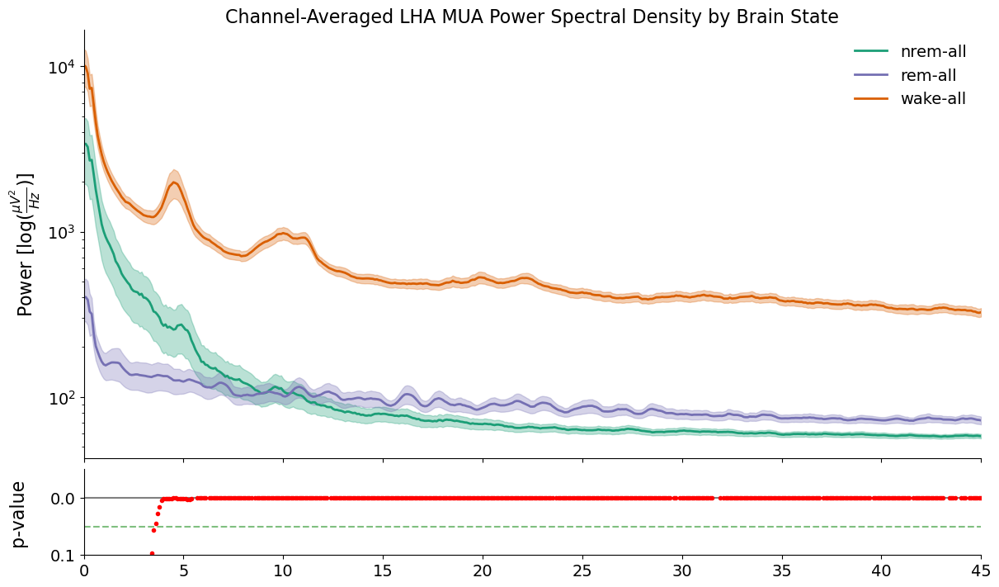

In [ ]:
trig_color_dict = {"nrem-all": "#1b9e77", "rem-all": "#7570b3", "wake-all": "#d95f02"}
region = "hyp"
fig, axs = plt.subplots(
    nrows=2,
    figsize=(12, 7),
    constrained_layout=True,
    height_ratios=[5, 1],
    sharex=True,
)
ax = axs[0]
for state, state_df_group in state_df.groupby("state"):
    ax.plot(
        state_df_group.freq,
        state_df_group.value["mean"],
        label=state,
        c=trig_color_dict[state],
        lw=2,
    )
    ax.fill_between(
        x=state_df_group.freq,
        y1=state_df_group.value["mean"] - state_df_group.value["sem"],
        y2=state_df_group.value["mean"] + state_df_group.value["sem"],
        color=trig_color_dict[state],
        alpha=0.3,
    )
    ax.set_yscale("log")
    # ax.set_xscale("log")
ax.set_xlim([0, 45])
# ax.set_ylim([10e-2, 10e3])
ax.legend(frameon=False)
ax.spines[["top", "right"]].set_visible(False)
ax.set_title("Channel-Averaged LHA MUA Power Spectral Density by Brain State")
ax.set_ylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$")
ax = axs[1]
p_vals = {
    float(f): f_data["p_value"]
    for f, f_data in stat_res.items()
    if f_data["model"].converged
}
ax.axhline(0.0, ls="-", c="k", alpha=0.5)
ax.axhline(0.05, ls="--", c="g", alpha=0.5)
ax.plot(
    np.array(list(p_vals.keys()), dtype=float),
    np.array(list(p_vals.values())),
    ls="",
    marker=".",
    c="r",
)
ax.spines[["top", "right"]].set_visible(False)
ax.set_ylim([0.1, -0.05])
ax.set_ylabel("p-value", labelpad=20)
# fig.savefig(
#     Path("/gpfs01/born/animal/DanielG/hypo_sleep/figures/", "hyp_psd_state_stats.png"),
#     dpi=400,
#     facecolor="white",
#     transparent=False,
#     bbox_inches="tight",
# )

In [ ]:
state_color_dict = {"nrem-all": "#1b9e77", "rem-all": "#7570b3", "wake-all": "#d95f02"}
state_amp_dict = {
    state: {animal: None for animal in ["HYDO03", "HYDO04"]} for state in states
}
for state, animal_epochs in epoch_state_dict.items():
    for animal, epochs in animal_epochs.items():
        if len(epochs) > 0:
            state_amp_dict[state][animal] = xr.concat(
                [epoch.mean(dim="time") for epoch in epochs], dim="epoch"
            )

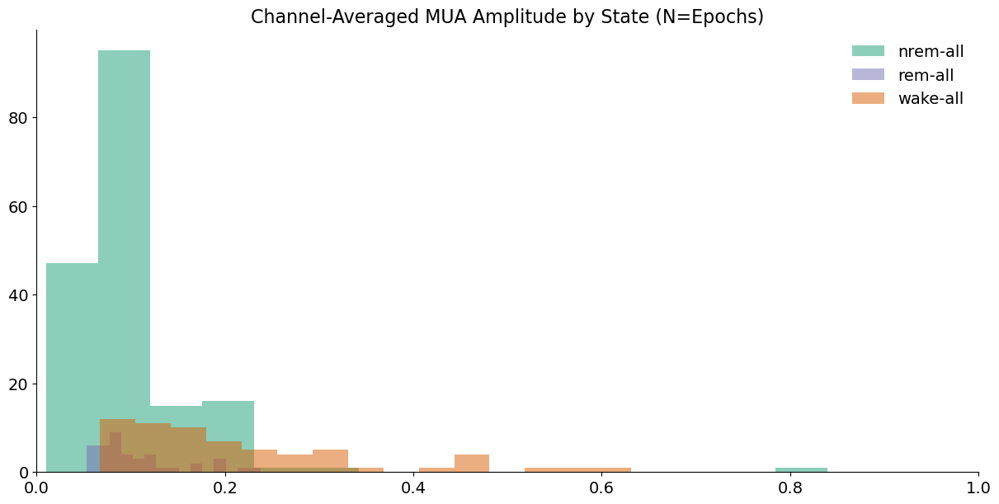

In [ ]:
fig, ax = plt.subplots(
    figsize=(12, 6),
    constrained_layout=True,
)
for state, animal_amp in state_amp_dict.items():
    state_amp = xr.concat(animal_amp.values(), dim="epoch")
    amp = state_amp.mean(dim="channel")
    ax.hist(amp.values, bins=15, alpha=0.5, label=state, color=state_color_dict[state])
    ax.set_title("Channel-Averaged MUA Amplitude by State (N=Epochs)")
    ax.set_xlim([0, 1])
    ax.spines[["top", "right"]].set_visible(False)
ax.legend(frameon=False)

In [ ]:
fig, axs = plt.subplots(
    nrows=16,
    ncols=2,
    figsize=(20, 30),
    sharex=True,
    sharey=True,
    constrained_layout=True,
)
for state, animal_amp in state_amp_dict.items():
    state_amp = xr.concat(animal_amp.values(), dim="epoch")
    for ax, tmp_ch in zip(axs.ravel(), depth_ordered_chs[::-1]):
        amp = state_amp.sel(channel=tmp_ch)
        ax.hist(
            amp.values,
            bins=15,
            alpha=0.5,
            label=state,
            color=state_color_dict[state],
            density=True,
        )
        ax.set_title(tmp_ch)
        ax.set_xlim([0, 0.5])
        ax.spines[["top", "right"]].set_visible(False)
ax.legend(frameon=False)

NameError: name 'plt' is not defined

NameError: name 'state_color_dict' is not defined

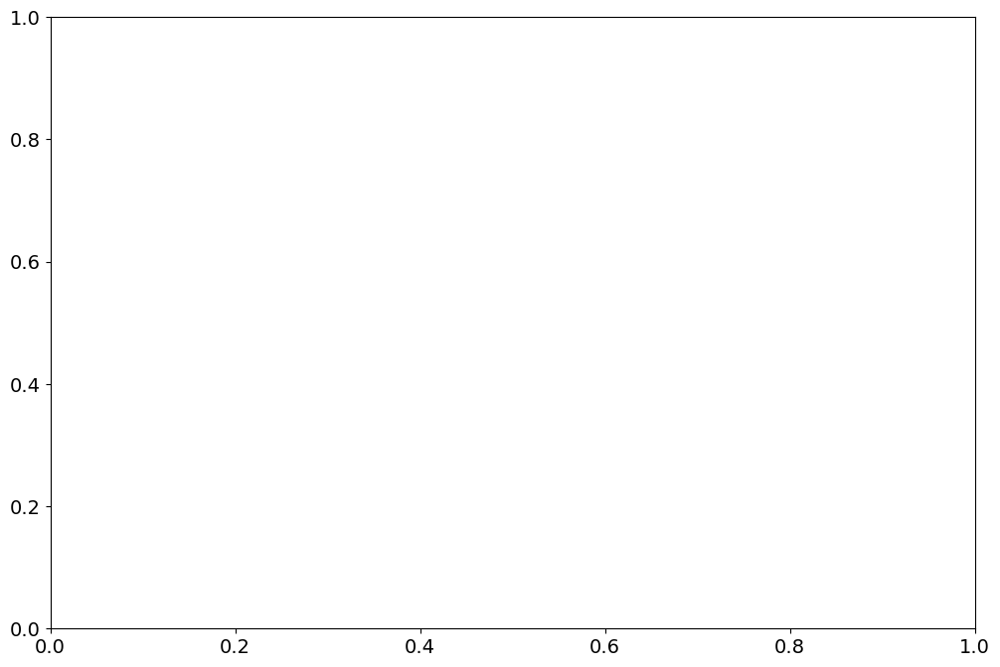

In [ ]:
channel = "16"
fig, ax = plt.subplots(figsize=(12, 8))
for state, animal_amp in state_amp_dict.items():
    for animal, amp in animal_amp.items():
        ax.hist(
            amp.sel(channel=channel),
            bins="fd",
            label=f"{state}-{animal}",
            alpha=0.4,
            color=state_color_dict[state],
        )
ax.set_xlim(0, 0.5)
ax.legend()

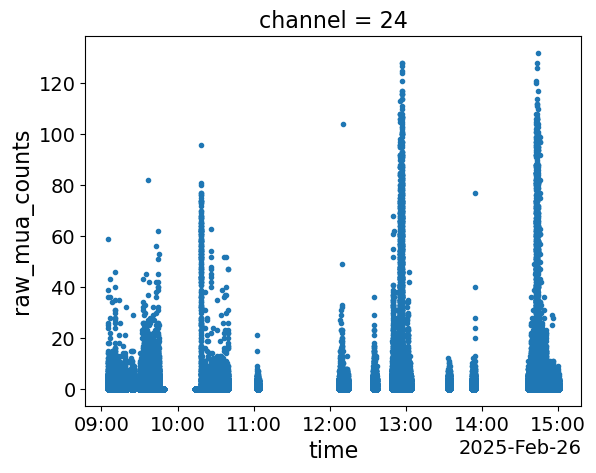

In [ ]:
tmp.sel(channel=depth_ordered_chs[0]).plot(marker=".", ls="")

In [ ]:
state_data_dict["none"]["2025-02-18_09-19-26"]["nrem-all"]

<xarray.DataArray 'raw_mua_counts' (channel: 32, time: 1718445)> Size: 440MB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 3, 0],
       [0, 3, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])
Coordinates:
  * channel  (channel) <U2 256B '26' '27' '10' '28' '11' ... '19' '5' '20' '21'
  * time     (time) datetime64[ns] 14MB 2025-02-18T10:44:56.995000 ... 2025-0...